# Analysis of Used Cars Dataset

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, accuracy_score

# pd.set_option("display.max_columns", None)


Displaying the head


In [3]:
df = pd.read_csv("used_car_price_dataset_extended.csv")
df.head()


,make_year,mileage_kmpl,engine_cc,fuel_type,owner_count,price_usd,brand,transmission,color,service_history,accidents_reported,insurance_valid
0,2001,8.17,4000,Petrol,4,8587.64,Chevrolet,Manual,White,NaN,0,No
1,2014,17.59,1500,Petrol,4,5943.50,Honda,Manual,Black,NaN,0,Yes
2,2023,18.09,2500,Diesel,5,9273.58,BMW,Automatic,Black,Full,1,Yes
3,2009,11.28,800,Petrol,1,6836.24,Hyundai,Manual,Blue,Full,0,Yes
4,2005,12.23,1000,Petrol,2,4625.79,Nissan,Automatic,Red,Full,0,Yes


### Basic Information About the Data

In [4]:
df.info()
df.isna().sum().sum()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   make_year           10000 non-null  int64  
 1   mileage_kmpl        10000 non-null  float64
 2   engine_cc           10000 non-null  int64  
 3   fuel_type           10000 non-null  object 
 4   owner_count         10000 non-null  int64  
 5   price_usd           10000 non-null  float64
 6   brand               10000 non-null  object 
 7   transmission        10000 non-null  object 
 8   color               10000 non-null  object 
 9   service_history     7962 non-null   object 
 10  accidents_reported  10000 non-null  int64  
 11  insurance_valid     10000 non-null  object 
dtypes: float64(2), int64(4), object(6)
memory usage: 937.6+ KB


np.int64(2038)

Checking the percentage of missing values

In [5]:
missing_val_percentage = lambda df: (df.isnull().sum() / len(df)).sort_values(ascending = False)
missing_val_percentage(df)

service_history       0.2038
make_year             0.0000
engine_cc             0.0000
mileage_kmpl          0.0000
fuel_type             0.0000
owner_count           0.0000
brand                 0.0000
price_usd             0.0000
transmission          0.0000
color                 0.0000
accidents_reported    0.0000
insurance_valid       0.0000
dtype: float64

NaN to None


In [6]:
cols_to_fix = ['service_history', 'color']  # or others where this occurs

for col in cols_to_fix:
    df[col] = df[col].fillna('None')

In [7]:
missing_val_percentage = lambda df: (df.isnull().sum() / len(df)).sort_values(ascending = False)
missing_val_percentage(df)

make_year             0.0
mileage_kmpl          0.0
engine_cc             0.0
fuel_type             0.0
owner_count           0.0
price_usd             0.0
brand                 0.0
transmission          0.0
color                 0.0
service_history       0.0
accidents_reported    0.0
insurance_valid       0.0
dtype: float64

Data is complete. The 'none' in service history is a parameter

### Data Visualization

In [10]:
fig = px.histogram(df, x="price_usd", nbins=50, title="Distribution of car prices (USD)")
fig.show()


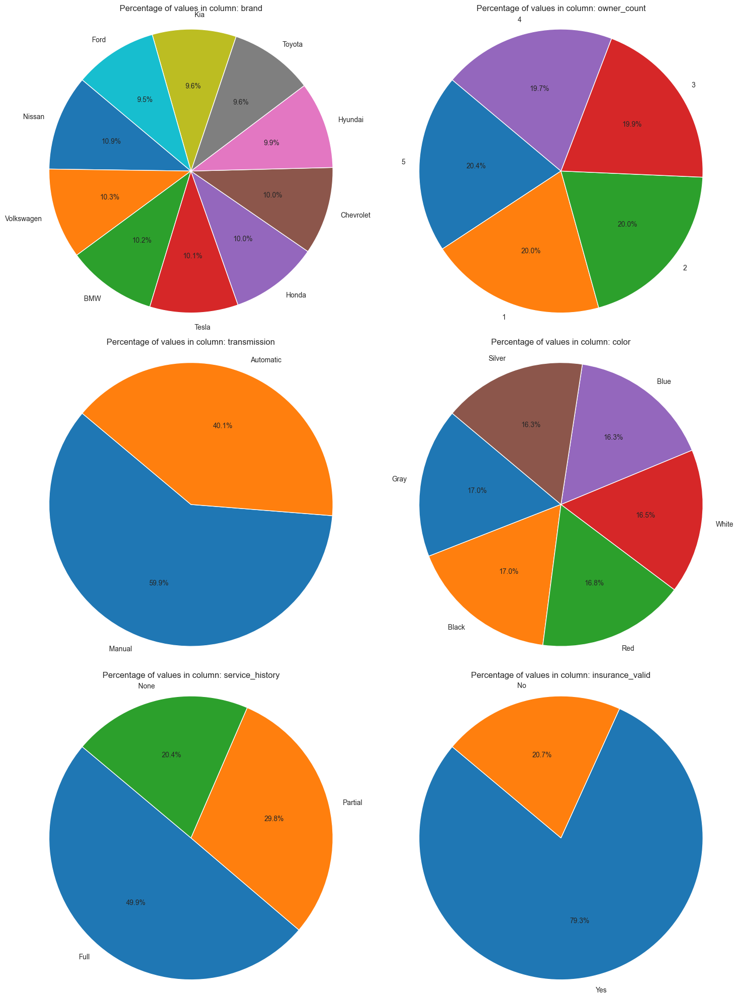

In [13]:

# List of columns to analyze
categorical_cols = ['brand','owner_count', 'transmission', 'color', 'service_history', 'insurance_valid']

wedge_props = {'edgecolor': 'white'}
plt.figure(figsize=(15, 20))

for i, col in enumerate(categorical_cols, 1):
    plt.subplot(3, 2, i)
    counts = df[col].value_counts()
    plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140, wedgeprops=wedge_props)
    plt.title(f"Percentage of values in column: {col}")
    plt.axis('equal')



plt.tight_layout()
plt.show()


In [14]:
fig = px.scatter(df, x="make_year", y="price_usd", color="fuel_type", title="Price vs Make Year")
fig.show()


In [15]:
top10_expensive = df.sort_values(by='price_usd', ascending=False).head(10)
print(top10_expensive[['brand', 'make_year', 'price_usd', 'engine_cc', 'fuel_type', 'mileage_kmpl']])


           brand  make_year  price_usd  engine_cc fuel_type  mileage_kmpl
5173     Hyundai       2015   17647.63       5000  Electric         25.36
5273       Tesla       2015   17395.45       5000  Electric         19.51
6512       Honda       2013   17155.52       5000  Electric         20.41
8848         Kia       2013   17044.39       5000  Electric         28.99
4470         BMW       2018   16945.60       4000  Electric         14.42
7198  Volkswagen       2002   16886.44       5000  Electric         33.44
9071   Chevrolet       2016   16826.37       5000  Electric         22.63
8348      Toyota       2021   16785.48       5000  Electric         19.33
4113  Volkswagen       2022   16765.07       5000  Electric         13.01
3458         BMW       2013   16759.39       5000  Electric         29.09


In [16]:
top10_cheapest = df.sort_values(by='price_usd', ascending=True).head(10)
print(top10_cheapest[['brand', 'make_year', 'price_usd', 'engine_cc', 'fuel_type', 'mileage_kmpl']])

           brand  make_year  price_usd  engine_cc fuel_type  mileage_kmpl
5616      Nissan       2001     1000.0       1000    Diesel          9.00
7072      Toyota       2002     1000.0        800    Petrol         11.44
7192         BMW       1996     1000.0       1500    Petrol         11.76
1980  Volkswagen       1999     1000.0       1000    Petrol         21.45
617    Chevrolet       1995     1000.0       1000    Diesel         15.03
5875      Toyota       1996     1000.0       1500    Diesel          9.59
8430   Chevrolet       1995     1000.0       1200    Diesel         13.16
1434  Volkswagen       1999     1000.0       1800    Diesel          9.72
2681         Kia       1995     1000.0       1200    Diesel         10.56
9538       Tesla       1998     1000.0        800    Petrol         18.29


In [19]:
figures = []
for col in ['make_year', 'mileage_kmpl', 'engine_cc', 'owner_count']:
    fig = px.scatter(
        df,
        x=col,
        y='price_usd',
        color='brand',
        title=f'Price vs {col.upper()}',
        trendline='ols'
    )
    figures.append(fig)

for col in ['brand', 'fuel_type', 'transmission', 'color', 'service_history', 'insurance_valid']:
    fig = px.box(
        df,
        x=col,
        y='price_usd',
        color=col,
        title=f'Price vs {col.upper()}',
        points='all'
    )
    figures.append(fig)

for fig in figures:
    fig.show()

In [20]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Numerical values
num_cols = df.select_dtypes(include='number').columns

# Calculate number of rows needed for 2 columns
n = len(num_cols)
n_rows = (n // 2) + (n % 2)

# List of colours
colors = ['indianred', 'mediumseagreen', 'royalblue', 'darkorange', 'purple', 'cyan', 'magenta', 'goldenrod']

fig = make_subplots(rows=n_rows, cols=2, subplot_titles=num_cols)

row_num, col_num = 1, 1
for i, col in enumerate(num_cols):
    fig.add_trace(
        go.Box(
            y=df[col],
            name=col,
            boxmean=True,
            marker_color=colors[i % len(colors)],
            hovertext=df['brand'] if 'brand' in df.columns else None
        ),
        row=row_num,
        col=col_num
    )
    # Move to the next column / row
    if col_num == 2:
        col_num = 1
        row_num += 1
    else:
        col_num += 1


# Layout settings
fig.update_layout(
    height=300 * n_rows,
    width=1000,
    title_text="📦 Box plots of numerical variables (Plotly)",
    showlegend=False,
    template='plotly_white',
    margin=dict(t=80, b=40)
)

fig.show()


### Data Cleaning and Feature Engineering

We can see that some values are outliers, so we'll trim them


In [22]:
# Function for removing outliers using IQR
def remove_outliers_iqr(df, columns):
    df_clean = df.copy()
    for col in columns:
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)]
    return df_clean

# Selecting numerical columns for cleaning
num_cols = ['price_usd', 'mileage_kmpl', 'engine_cc', 'owner_count']

# Creating a new DataFrame without outlier values
df_no_outliers = remove_outliers_iqr(df, num_cols)

# Checking how many rows were removed
print(f"Originally: {df.shape[0]} rows")
print(f"After removing outliers: {df_no_outliers.shape[0]} rows")


Originally: 10000 rows
After removing outliers: 9907 rows


Checking the result on price


In [23]:
import plotly.express as px

# Example: Price boxplot before and after cleaning
fig = px.box(df, y='price_usd', title='Price (USD) with Outliers')
fig.show()

fig_clean = px.box(df_no_outliers, y='price_usd', title='Price (USD) after Removing Outliers')
fig_clean.show()

In [26]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Numerical variables
num_cols = df_no_outliers.select_dtypes(include='number').columns

n = len(num_cols)
n_rows = (n // 2) + (n % 2)

colors = ['indianred', 'mediumseagreen', 'royalblue', 'darkorange', 'purple', 'cyan', 'magenta', 'goldenrod']

fig = make_subplots(rows=n_rows, cols=2, subplot_titles=num_cols)

row_num, col_num = 1, 1
for i, col in enumerate(num_cols):
    fig.add_trace(
        go.Box(
            y=df_no_outliers[col],
            name=col,
            boxmean=True,
            marker_color=colors[i % len(colors)],
            hovertext=df_no_outliers['brand'] if 'brand' in df_no_outliers.columns else None
        ),
        row=row_num,
        col=col_num
    )
    # Move to the next column / row
    if col_num == 2:
        col_num = 1
        row_num += 1
    else:
        col_num += 1

# Layout settings
fig.update_layout(
    height=300 * n_rows,
    width=1000,
    title_text="📦 Box plots of numerical variables (Plotly)",
    showlegend=False,
    template='plotly_white',
    margin=dict(t=80, b=40)
)

fig.show()

Price dependency on individual factors after trimming values






In [28]:
figures = []
for col in ['make_year', 'mileage_kmpl', 'engine_cc', 'owner_count']:
    fig = px.scatter(
        df_no_outliers,
        x=col,
        y='price_usd',
        color='brand',
        title=f'Price vs {col.upper()}',
        trendline='ols'
    )
    figures.append(fig)

# Categorical variables
for col in ['brand', 'fuel_type', 'transmission', 'color', 'service_history', 'insurance_valid']:
    fig = px.box(
        df_no_outliers,
        x=col,
        y='price_usd',
        color=col,
        title=f'Price vs {col.upper()}',
        points='all'
    )
    figures.append(fig)

for fig in figures:
    fig.show()

### Preparing Data for Modeling

In [30]:
X = df.drop("price_usd", axis=1)
y = df["price_usd"]

categorical_cols = X.select_dtypes(include=["object"]).columns.tolist()
numerical_cols = X.select_dtypes(include=["int64", "float64"]).columns.tolist()

numeric_transformer = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

categorical_transformer = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer([
    ("num", numeric_transformer, numerical_cols),
    ("cat", categorical_transformer, categorical_cols)
])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Training and Evaluation of Regression Models

In [31]:
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Neural Network": MLPRegressor(hidden_layer_sizes=(64, 32), max_iter=500, random_state=42)
}

results = {}
for name, model in models.items():
    pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("regressor", model)
    ])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    results[name] = {"MSE": mse, "R2": r2}

pd.DataFrame(results).T


,MSE,R2
Linear Regression,9.821137e+05,0.876549
Random Forest,1.176444e+06,0.852122
Neural Network,9.829867e+05,0.876440


Final Conclusions on the Untrimmed Dataset

- Linear regression and neural network achieve the highest fit (R² ≈ 0.877)
- Random forest also gives good results, though slightly worse
- Car price is strongly dependent on its age and fuel type


Traininig the trimmed data set

In [32]:
# Full dataset

X_full = df.drop('price_usd', axis=1)
y_full = df['price_usd']

# Training set – outliers removed
X_train = df_no_outliers.drop('price_usd', axis=1)
y_train = df_no_outliers['price_usd']

# Numerical and categorical columns - full dataset
categorical_cols = X_full.select_dtypes(include=["object"]).columns.tolist()
numerical_cols = X_full.select_dtypes(include=["int64", "float64"]).columns.tolist()

# Pipeline for processing numerical data
numeric_transformer = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

# Pipeline for processing categorical data
categorical_transformer = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer([
    ("num", numeric_transformer, numerical_cols),
    ("cat", categorical_transformer, categorical_cols)
])

In [33]:
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Neural Network": MLPRegressor(hidden_layer_sizes=(64, 32), max_iter=500, random_state=42)
}

results = {}

for name, model in models.items():
    pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("regressor", model)
    ])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_full)

    results[name] = {
        "MSE": mean_squared_error(y_full, y_pred),
        "R2": r2_score(y_full, y_pred)
    }
pd.DataFrame(results).T

,MSE,R2
Linear Regression,998861.938465,0.872150
Random Forest,207038.332914,0.973500
Neural Network,999542.067730,0.872063


Final conclusions on the Trimmed Dataset


- Random forest has the highest fit on, way higher than on the untrimmed dataset
- The rest of the models have similar performed similar on the untrimmed dataset

